In [114]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings("ignore")
from scipy.stats             import ttest_1samp,ttest_ind, wilcoxon, shapiro, levene
from statsmodels.stats.power import ttest_power
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error

### Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [115]:
pd.options.display.max_rows = 999
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [116]:
#from google.colab import files
#import io

#try:
    #uploaded
#except NameError:
    #uploaded = files.upload()

#df = pd.read_excel(io.BytesIO(uploaded['compactiv.xlsx']))

In [117]:
df = pd.read_excel('compactiv.xlsx')
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,0.0,0.0,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,0.0,0.0,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,0.0,0.0,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,0.0,0.0,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [118]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(8192, 22)


In [119]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [120]:
df.shape

(8192, 22)

In [121]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


In [122]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [123]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [124]:
df.duplicated().sum()

0

In [125]:
from pylab import rcParams
rcParams['figure.figsize'] = 19,12

In [126]:
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [127]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'], dtype='object')

In [128]:
outliers = find_outliers_IQR(df[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr']])

print('number of outliers: '+ str(len(outliers)))

print('max outlier value: '+ str(outliers.max()))

print('min outlier value: '+ str(outliers.min()))

outliers

number of outliers: 8192
max outlier value: lread          1845.0
lwrite          575.0
scall         12493.0
sread          5318.0
swrite         5456.0
fork            20.12
exec            59.56
rchar       2526649.0
wchar       1801623.0
pgout           81.44
ppgout          184.2
pgfree          523.0
pgscan         1237.0
atch           211.58
pgin            141.2
ppgin          292.61
pflt            899.8
vflt           1365.0
runqsz           None
freemem       12027.0
freeswap         45.0
usr              61.0
dtype: object
min outlier value: lread           48.0
lwrite          26.0
scall         6777.0
sread          569.0
swrite         369.0
fork            4.98
exec            6.79
rchar       618922.0
wchar       231266.0
pgout           6.01
ppgout         10.56
pgfree         12.57
pgscan           0.2
atch            1.59
pgin           23.55
ppgin          33.67
pflt           362.0
vflt           561.6
runqsz          None
freemem       4667.0
freeswap         2.

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4670.0,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7278.0,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7248.0,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.02,20.64,43.69,55.11,NaN,35.87,47.9,NaN,NaN,NaN,NaN,NaN,NaN
8188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.40,45.2,NaN,NaN,NaN,NaN,NaN,NaN
8190,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.03,18.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
outliers.nunique()

lread        187
lwrite       163
scall        100
sread        238
swrite       279
fork         154
exec         271
rchar        453
wchar        815
pgout        311
ppgout       611
pgfree       895
pgscan      1201
atch         240
pgin         436
ppgin        529
pflt         351
vflt         459
runqsz         0
freemem      971
freeswap      35
usr           18
dtype: int64

In [130]:
from scipy.stats import iqr

In [131]:
num = df.select_dtypes(['float64','int64'])
cat = df.select_dtypes(['object'])

In [132]:
def zero_count(_series):
    counter=0
    for val in _series:
        if val==0:
            counter+=1
    return counter 

def negative_count(_series):
    counter=0
    for val in _series:
        if val < 0:
            counter+=1
    return counter 

def percent_outlier(_series):
    counter = 0
    lb = np.quantile(_series,.25) - (1.5*iqr(_series))
    ub = np.quantile(_series,.75) + (1.5*iqr(_series))
    for val in _series:
        if val>ub or val<lb: 
            counter=counter+1
        else : pass
    return 100*counter/len(_series)

stat_list = ['TOTAL RECORDS',
 'NULL COUNT',
 'ZERO COUNT',
 'NEGATIVE COUNT',
 'MIN',
 'MAX',
 'RANGE',
 'MEAN',
 'MEDIAN',
 'MODE',
 'VARIANCE',
 'STD DEV',
 'Q1',
 'Q3',
 'IQR',
 'SKEWNESS',
 'KURTOSIS']

def stat_function(_series):
    return [round(val,2) for val in 
          [len(_series),
           _series.isna().sum(),
           zero_count(_series),
           negative_count(_series),
           min(_series),
           max(_series),
           max(_series)-min(_series),
           _series.mean(),
           np.percentile(_series,.5),
           _series.mode()[0],
           st.variance(_series),
           st.stdev(_series),
           np.percentile(_series,.25),
           np.percentile(_series,.75),
           iqr(_series),
           stats.skew(_series),
           stats.kurtosis(_series)]
          ]

def stat_df(data, feature_list):
    stat_dictionary = {}
    for x in feature_list:
        stat_dictionary[x] = stat_function(data[x])
    return pd.DataFrame(stat_dictionary, index = stat_list).T

# Finding % Outliers in our Data
def outlier_percentage_df(data, features_list):
    dict_outlier = {}
    for x in features_list:
        dict_outlier[x]=round(percent_outlier(data[x]),2)
    return pd.DataFrame(dict_outlier, index=["% OUTLIERS"]).T.sort_values("% OUTLIERS", ascending=False)

In [133]:
categoriacl_features=[]
numerical_features=[]
for i in df.columns:
    if df[i].dtype=="object":
        categoriacl_features.append(i)
    else:
        numerical_features.append(i)
print(categoriacl_features) 
print(numerical_features)


['runqsz']
['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'usr']


In [134]:
outlier_percentage_df(df, numerical_features)

,% OUTLIERS
pgscan,21.29
pgfree,18.98
ppgout,16.05
lwrite,15.93
atch,14.76
freemem,14.47
pgout,12.06
fork,11.51
ppgin,10.02
pgin,9.63


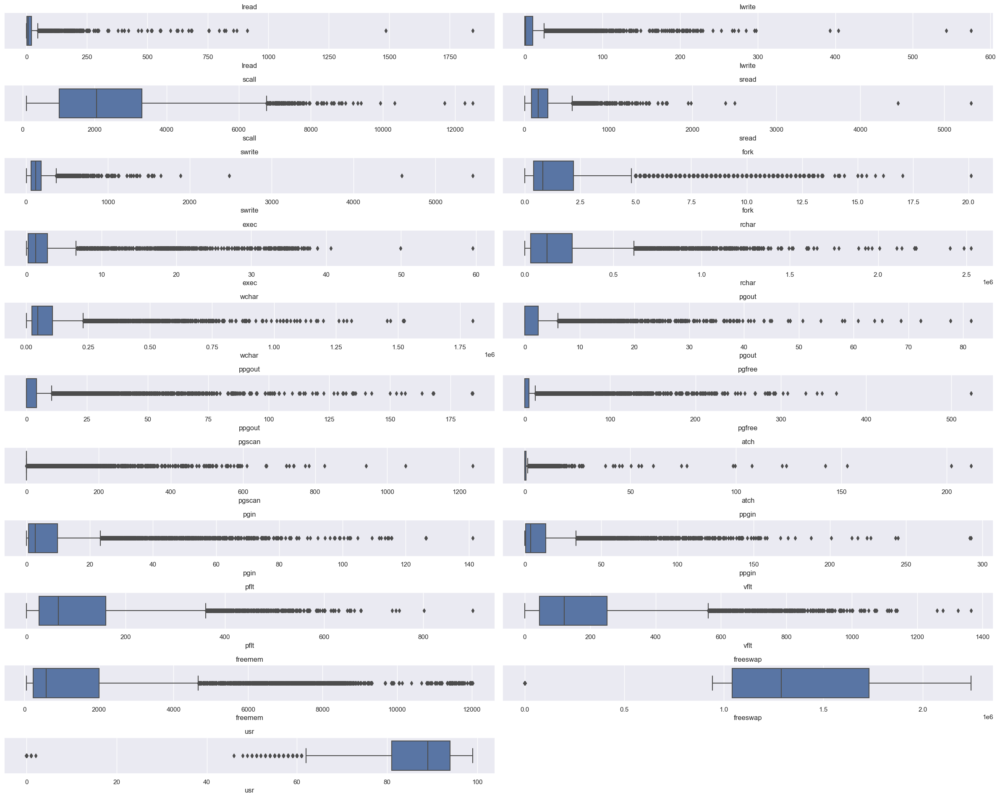

In [135]:
df_col = num.columns
a = len(df_col)
b = 2
c = 1 
fig = plt.figure(figsize=(24,36))
for i in df_col:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.boxplot(num[i])
    c = c + 1
plt.tight_layout()
plt.show()

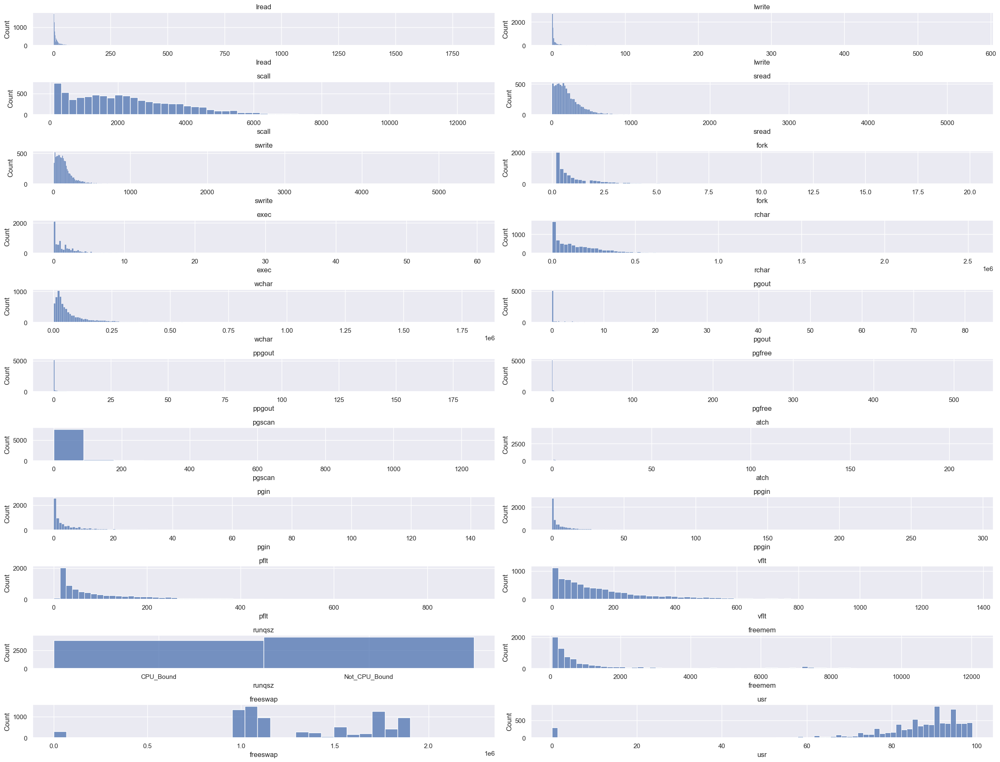

In [136]:
df_col = df.columns
a = len(df_col)
b = 2
c = 1 
fig = plt.figure(figsize=(24,36))
for i in df_col:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.histplot(df[i])
    c = c + 1
plt.tight_layout()
plt.show()

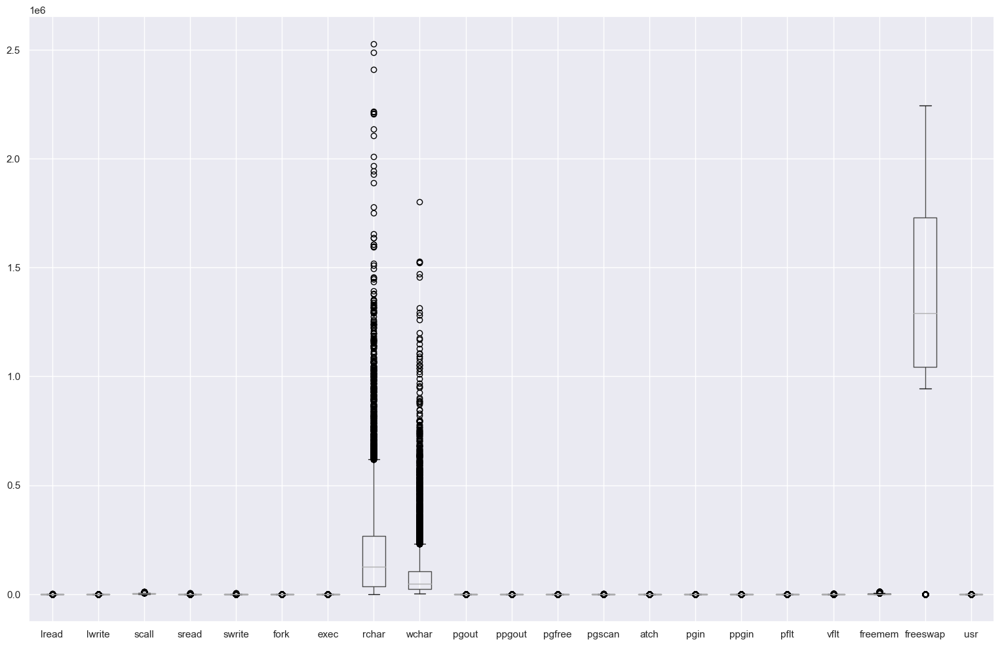

In [137]:
df.boxplot();

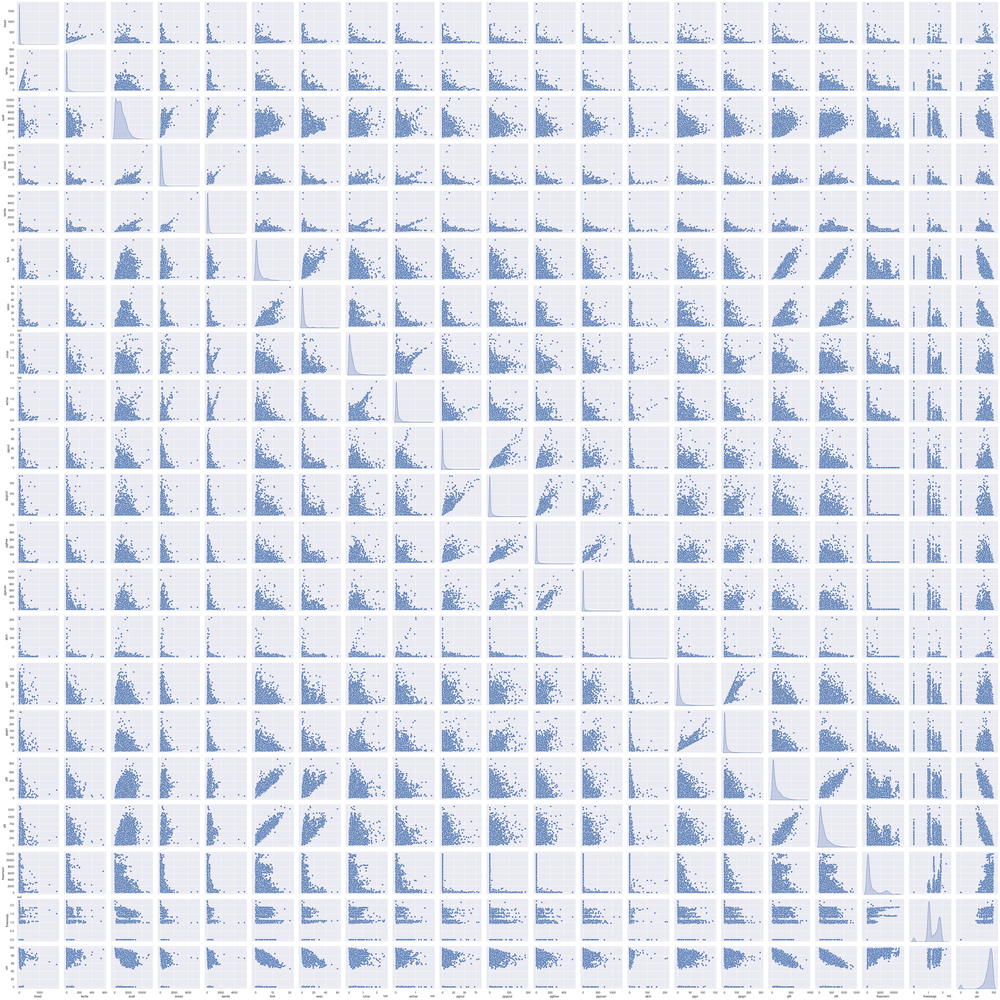

In [138]:
sns.pairplot(data = df, diag_kind = 'kde');

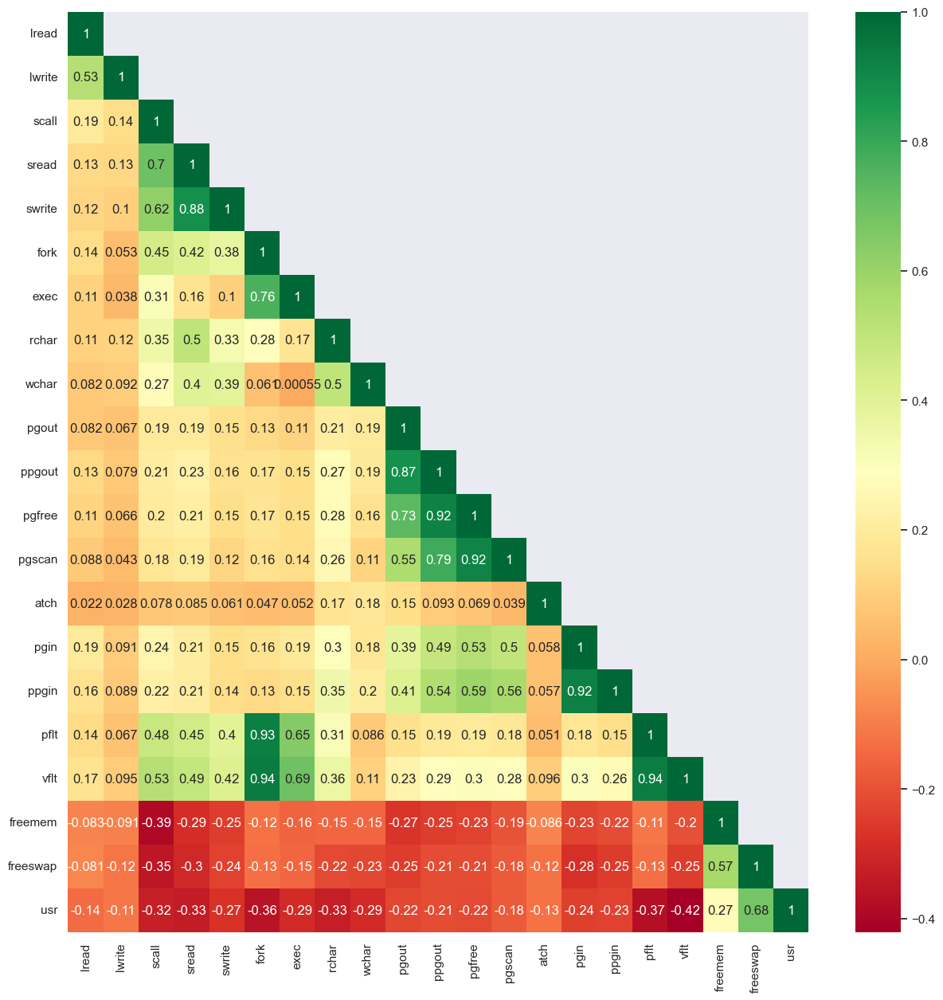

In [139]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr(),+1),cmap='RdYlGn');

In [140]:
import scipy.stats as stats

In [141]:
for column in df[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr']]:
    columnSeriesObj = df[column]
    print('Column Name : ', column)
    print('Minimum Value : ', columnSeriesObj.min())
    print('25% = ',columnSeriesObj.quantile(0.25))
    print('50% or Median= ',columnSeriesObj.quantile(0.5))
    print('75% = ',columnSeriesObj.quantile(0.75))
    print('Maximum Value = ',columnSeriesObj.max())
    print('IQR = ',stats.iqr(columnSeriesObj))
    print('----------------------------------')

Column Name :  lread
Minimum Value :  0
25% =  2.0
50% or Median=  7.0
75% =  20.0
Maximum Value =  1845
IQR =  18.0
----------------------------------
Column Name :  lwrite
Minimum Value :  0
25% =  0.0
50% or Median=  1.0
75% =  10.0
Maximum Value =  575
IQR =  10.0
----------------------------------
Column Name :  scall
Minimum Value :  109
25% =  1012.0
50% or Median=  2051.5
75% =  3317.25
Maximum Value =  12493
IQR =  2305.25
----------------------------------
Column Name :  sread
Minimum Value :  6
25% =  86.0
50% or Median=  166.0
75% =  279.0
Maximum Value =  5318
IQR =  193.0
----------------------------------
Column Name :  swrite
Minimum Value :  7
25% =  63.0
50% or Median=  117.0
75% =  185.0
Maximum Value =  5456
IQR =  122.0
----------------------------------
Column Name :  fork
Minimum Value :  0.0
25% =  0.4
50% or Median=  0.8
75% =  2.2
Maximum Value =  20.12
IQR =  1.8000000000000003
----------------------------------
Column Name :  exec
Minimum Value :  0.0
25% = 

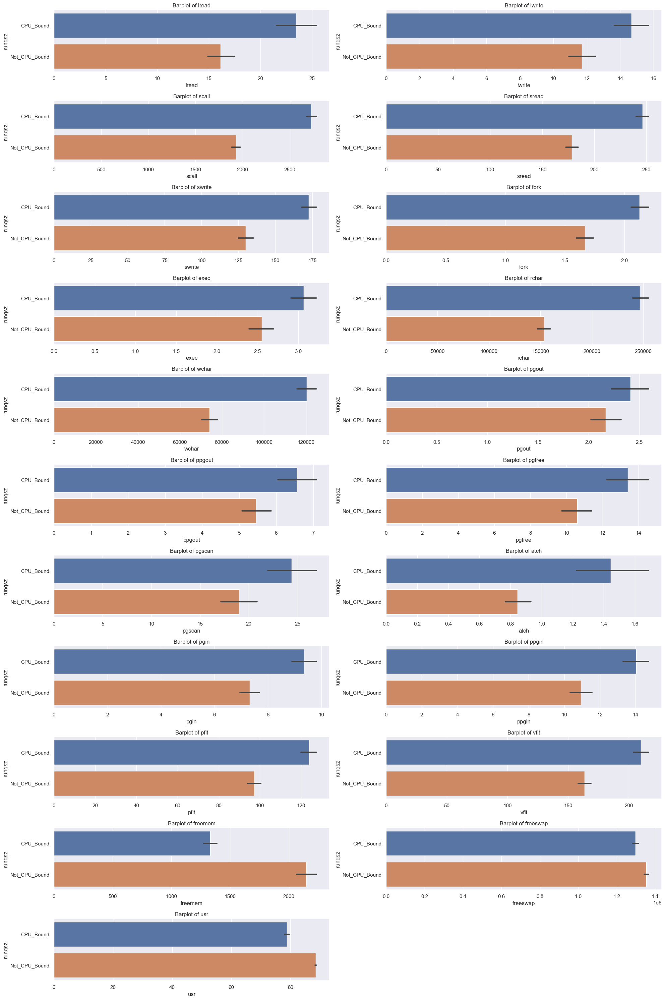

In [142]:
plt.figure(figsize = (20,30))
feature_list = num.columns
for i in range(len(feature_list)):
    plt.subplot(11, 2, i + 1)
    sns.barplot(x = num[feature_list[i]], y = cat['runqsz'],data = df)
    plt.title('Barplot of {}'.format(feature_list[i]))
    plt.tight_layout()

### Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [143]:
from sklearn.impute import SimpleImputer

In [144]:
mean_value1=df['rchar'].mean()
mean_value1

197385.72836300693

In [145]:
df['rchar'].fillna(value=mean_value1, inplace=True)

In [146]:
mean_value2=df['wchar'].mean()

In [147]:
df['wchar'].fillna(value=mean_value1, inplace=True)

In [148]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,0.0,0.0,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,0.0,0.0,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,0.0,0.0,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,0.0,0.0,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [149]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [150]:
df.count()

lread       8192
lwrite      8192
scall       8192
sread       8192
swrite      8192
fork        8192
exec        8192
rchar       8192
wchar       8192
pgout       8192
ppgout      8192
pgfree      8192
pgscan      8192
atch        8192
pgin        8192
ppgin       8192
pflt        8192
vflt        8192
runqsz      8192
freemem     8192
freeswap    8192
usr         8192
dtype: int64

In [151]:
for column_name in df.columns:
    column = df[column_name]
    count = (column == 0).sum()
    print('Count of zeros in column ', column_name, ' is : ', count)

Count of zeros in column  lread  is :  675
Count of zeros in column  lwrite  is :  2684
Count of zeros in column  scall  is :  0
Count of zeros in column  sread  is :  0
Count of zeros in column  swrite  is :  0
Count of zeros in column  fork  is :  21
Count of zeros in column  exec  is :  21
Count of zeros in column  rchar  is :  0
Count of zeros in column  wchar  is :  0
Count of zeros in column  pgout  is :  4878
Count of zeros in column  ppgout  is :  4878
Count of zeros in column  pgfree  is :  4869
Count of zeros in column  pgscan  is :  6448
Count of zeros in column  atch  is :  4575
Count of zeros in column  pgin  is :  1220
Count of zeros in column  ppgin  is :  1220
Count of zeros in column  pflt  is :  3
Count of zeros in column  vflt  is :  0
Count of zeros in column  runqsz  is :  0
Count of zeros in column  freemem  is :  0
Count of zeros in column  freeswap  is :  0
Count of zeros in column  usr  is :  283


### Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning

In [152]:
df = pd.get_dummies(df, drop_first=True)
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,0.0,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,0.0,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,0.0,0.0,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,0.0,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [153]:
X = df.drop(["usr"], axis=1)
y = df[["usr"]]

In [154]:
X = sm.add_constant(X)

In [155]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [156]:
X_train.head()

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
694,1.0,1,1,1345,223,192,0.6,0.6,198703.0,293578.0,0.60,6.20,23.40,56.4,2.60,3.80,7.40,28.20,56.60,121,1375446,0
5535,1.0,1,1,1429,87,67,0.2,0.2,7163.0,24842.0,0.00,0.00,0.00,0.0,0.00,1.60,1.60,15.77,30.74,1476,1021541,1
4244,1.0,49,71,3273,225,180,0.6,0.4,83246.0,53705.0,5.39,7.19,7.19,0.0,2.79,3.99,4.59,59.88,74.05,82,18,0
2472,1.0,13,8,4349,300,191,2.8,3.0,96009.0,70467.0,0.00,0.00,0.00,0.0,0.00,2.80,3.20,129.00,236.80,772,993909,0
7052,1.0,17,23,225,13,13,0.4,1.6,17132.0,12514.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,19.80,23.80,4179,1821682,1


In [157]:
X_test.head()

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
3894,1.0,27,39,1252,53,118,0.2,0.2,26592.0,54394.0,0.0,0.0,0.0,0.0,0.0,0.4,0.6,19.44,20.04,7762,1875466,1
4276,1.0,1,0,996,85,55,0.4,0.4,16667.0,36431.0,0.0,0.0,0.0,0.0,0.0,1.0,1.4,35.53,52.10,2979,1010114,1
3414,1.0,9,7,1530,247,135,0.4,0.4,14513.0,61905.0,13.8,19.2,30.4,24.2,10.4,14.8,18.4,26.80,186.20,89,11,0
4165,1.0,32,4,3243,182,140,5.2,5.6,337517.0,94832.0,0.8,1.0,1.0,0.0,1.4,4.6,7.0,250.60,420.20,1300,1535309,0
7385,1.0,16,3,5017,259,249,2.8,1.4,73537.0,237547.0,0.0,0.0,0.0,0.0,0.0,5.6,5.8,142.80,276.20,2114,988600,0


In [158]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

In [159]:
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     489.5
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:37   Log-Likelihood:                -21788.
No. Observations:                5734   AIC:                         4.362e+04
Df Residuals:                    5712   BIC:                         4.377e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.6423 

In [160]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   27.196572
lread                    1.472619
lwrite                   1.405963
scall                    2.414389
sread                    6.835434
swrite                   5.318842
fork                    18.210258
exec                     3.059757
rchar                    1.972604
wchar                    1.552236
pgout                    5.776002
ppgout                  15.907035
pgfree                  20.437679
pgscan                   9.237578
atch                     1.087534
pgin                     8.075029
ppgin                    8.670693
pflt                    11.834021
vflt                    20.231053
freemem                  1.677431
freeswap                 1.761133
runqsz_Not_CPU_Bound     1.119086
dtype: float64



In [234]:
olsmod_tr = sm.OLS(y_test, X_test)
olsres_tr = olsmod_tr.fit()

In [236]:
print(olsres_tr.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     206.7
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:20:38   Log-Likelihood:                -9479.5
No. Observations:                2458   AIC:                         1.900e+04
Df Residuals:                    2436   BIC:                         1.913e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   39.2494 

In [161]:
X_train2 = X_train.drop(["pgfree"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train2)
olsres_1 = olsmod_1.fit()

In [162]:
print(olsres_1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.641
Method:                 Least Squares   F-statistic:                     512.4
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:38   Log-Likelihood:                -21794.
No. Observations:                5734   AIC:                         4.363e+04
Df Residuals:                    5713   BIC:                         4.377e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.7133 

In [163]:
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])],
    index=X_train2.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const                   27.176502
lread                    1.472051
lwrite                   1.405924
scall                    2.413532
sread                    6.821993
swrite                   5.314195
fork                    18.098997
exec                     3.057417
rchar                    1.971897
wchar                    1.552230
pgout                    5.775992
ppgout                  10.897442
pgscan                   3.993835
atch                     1.087438
pgin                     8.050707
ppgin                    8.666044
pflt                    11.825640
vflt                    19.937702
freemem                  1.675517
freeswap                 1.759249
runqsz_Not_CPU_Bound     1.119076
dtype: float64



In [164]:
X_train3 = X_train2.drop(["vflt"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train3)
olsres_2 = olsmod_2.fit()

In [165]:
print(olsres_2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     533.7
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:38   Log-Likelihood:                -21814.
No. Observations:                5734   AIC:                         4.367e+04
Df Residuals:                    5714   BIC:                         4.380e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.7508 

In [166]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const                   25.847445
lread                    1.466877
lwrite                   1.396756
scall                    2.370295
sread                    6.780950
swrite                   5.279092
fork                    12.451700
exec                     3.046202
rchar                    1.956283
wchar                    1.537704
pgout                    5.760871
ppgout                  10.834977
pgscan                   3.959399
atch                     1.066379
pgin                     7.571121
ppgin                    8.519188
pflt                     8.850111
freemem                  1.675514
freeswap                 1.673843
runqsz_Not_CPU_Bound     1.119076
dtype: float64



In [167]:
X_train4 = X_train3.drop(["fork"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train4)
olsres_3 = olsmod_3.fit()

In [168]:
print(olsres_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     561.1
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:39   Log-Likelihood:                -21821.
No. Observations:                5734   AIC:                         4.368e+04
Df Residuals:                    5715   BIC:                         4.381e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.0253 

In [169]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train4.values, i) for i in range(X_train4.shape[1])],
    index=X_train4.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const                   25.612032
lread                    1.461328
lwrite                   1.394094
scall                    2.355212
sread                    6.774680
swrite                   5.144057
exec                     1.896413
rchar                    1.953691
wchar                    1.530906
pgout                    5.760838
ppgout                  10.833405
pgscan                   3.957671
atch                     1.066379
pgin                     7.571096
ppgin                    8.509881
pflt                     2.344289
freemem                  1.675514
freeswap                 1.672780
runqsz_Not_CPU_Bound     1.118488
dtype: float64



In [170]:
X_train5 = X_train4.drop(["ppgout"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train5)
olsres_4 = olsmod_4.fit()

In [171]:
print(olsres_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     593.8
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:40   Log-Likelihood:                -21822.
No. Observations:                5734   AIC:                         4.368e+04
Df Residuals:                    5716   BIC:                         4.380e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.9162 

In [172]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train5.values, i) for i in range(X_train5.shape[1])],
    index=X_train5.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

VIF values: 

const                   25.322217
lread                    1.435481
lwrite                   1.393953
scall                    2.351604
sread                    6.719377
swrite                   5.126053
exec                     1.892475
rchar                    1.953685
wchar                    1.527007
pgout                    1.602247
pgscan                   1.992399
atch                     1.062712
pgin                     7.553432
ppgin                    8.459080
pflt                     2.342984
freemem                  1.675511
freeswap                 1.660663
runqsz_Not_CPU_Bound     1.118488
dtype: float64



In [173]:
X_train6 = X_train5.drop(["ppgin"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train6)
olsres_5 = olsmod_5.fit()

In [174]:
print(olsres_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     628.8
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:40   Log-Likelihood:                -21829.
No. Observations:                5734   AIC:                         4.369e+04
Df Residuals:                    5717   BIC:                         4.381e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.0322 

In [175]:
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train6.values, i) for i in range(X_train6.shape[1])],
    index=X_train6.columns,
)
print("VIF values: \n\n{}\n".format(vif_series6))

VIF values: 

const                   25.273707
lread                    1.433215
lwrite                   1.393106
scall                    2.350925
sread                    6.719340
swrite                   5.126009
exec                     1.891486
rchar                    1.908248
wchar                    1.525727
pgout                    1.601914
pgscan                   1.808570
atch                     1.062116
pgin                     1.565863
pflt                     2.334796
freemem                  1.675504
freeswap                 1.658519
runqsz_Not_CPU_Bound     1.117322
dtype: float64



In [176]:
X_train7 = X_train6.drop(["sread"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train7)
olsres_6 = olsmod_6.fit()

In [177]:
print(olsres_6.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     670.7
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:41   Log-Likelihood:                -21829.
No. Observations:                5734   AIC:                         4.369e+04
Df Residuals:                    5718   BIC:                         4.380e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.0506 

In [178]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train7.values, i) for i in range(X_train7.shape[1])],
    index=X_train7.columns,
)
print("VIF values: \n\n{}\n".format(vif_series7))

VIF values: 

const                   25.237235
lread                    1.432468
lwrite                   1.391224
scall                    2.141703
swrite                   1.866842
exec                     1.884698
rchar                    1.599294
wchar                    1.518556
pgout                    1.601760
pgscan                   1.802358
atch                     1.061655
pgin                     1.563999
pflt                     2.324804
freemem                  1.675171
freeswap                 1.651131
runqsz_Not_CPU_Bound     1.117317
dtype: float64



In [179]:
X_train8 = X_train7.drop(["lwrite"], axis=1)
olsmod_7 = sm.OLS(y_train, X_train8)
olsres_7 = olsmod_7.fit()

In [180]:
print(olsres_7.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     718.4
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:41   Log-Likelihood:                -21830.
No. Observations:                5734   AIC:                         4.369e+04
Df Residuals:                    5719   BIC:                         4.379e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.1714 

In [181]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train8.values, i) for i in range(X_train8.shape[1])],
    index=X_train8.columns,
)
print("VIF values: \n\n{}\n".format(vif_series8))

VIF values: 

const                   24.869698
lread                    1.067352
scall                    2.139125
swrite                   1.866665
exec                     1.883868
rchar                    1.597080
wchar                    1.518171
pgout                    1.601744
pgscan                   1.801825
atch                     1.061597
pgin                     1.558864
pflt                     2.324407
freemem                  1.675168
freeswap                 1.641836
runqsz_Not_CPU_Bound     1.117081
dtype: float64



In [182]:
X_train9 = X_train8.drop(["pgscan"], axis=1)
olsmod_8 = sm.OLS(y_train, X_train9)
olsres_8 = olsmod_8.fit()

In [183]:
print(olsres_8.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     773.1
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:42   Log-Likelihood:                -21832.
No. Observations:                5734   AIC:                         4.369e+04
Df Residuals:                    5720   BIC:                         4.378e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.2446 

In [184]:
vif_series9 = pd.Series(
    [variance_inflation_factor(X_train9.values, i) for i in range(X_train9.shape[1])],
    index=X_train9.columns,
)
print("VIF values: \n\n{}\n".format(vif_series9))

VIF values: 

const                   24.787361
lread                    1.063997
scall                    2.138833
swrite                   1.866489
exec                     1.883050
rchar                    1.575163
wchar                    1.510403
pgout                    1.282852
atch                     1.057840
pgin                     1.337064
pflt                     2.316645
freemem                  1.673393
freeswap                 1.639830
runqsz_Not_CPU_Bound     1.116947
dtype: float64



In [185]:
X_test

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
3894,1.0,27,39,1252,53,118,0.20,0.20,26592.0,54394.0,0.0,0.0,0.0,0.0,0.0,0.40,0.60,19.44,20.04,7762,1875466,1
4276,1.0,1,0,996,85,55,0.40,0.40,16667.0,36431.0,0.0,0.0,0.0,0.0,0.0,1.00,1.40,35.53,52.10,2979,1010114,1
3414,1.0,9,7,1530,247,135,0.40,0.40,14513.0,61905.0,13.8,19.2,30.4,24.2,10.4,14.80,18.40,26.80,186.20,89,11,0
4165,1.0,32,4,3243,182,140,5.20,5.60,337517.0,94832.0,0.8,1.0,1.0,0.0,1.4,4.60,7.00,250.60,420.20,1300,1535309,0
7385,1.0,16,3,5017,259,249,2.80,1.40,73537.0,237547.0,0.0,0.0,0.0,0.0,0.0,5.60,5.80,142.80,276.20,2114,988600,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,1.0,0,0,463,34,34,0.20,0.20,749.0,7750.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,15.60,16.80,4098,1776888,1
6918,1.0,12,1,2512,284,244,2.81,3.81,94187.0,98275.0,0.0,0.0,0.0,0.0,0.0,21.44,23.45,154.31,282.57,1316,1102746,1
1556,1.0,15,23,309,47,70,0.20,0.20,4288.0,10154.0,0.0,0.0,0.0,0.0,0.0,0.60,0.80,17.00,21.40,1929,1769096,0
1577,1.0,10,0,1984,57,59,2.00,6.20,3169.0,2233.0,0.0,0.0,0.0,0.0,0.0,0.40,0.40,69.20,121.60,847,1631198,0


In [186]:
X_test2 = X_test.drop(
    ["pgfree","vflt", "fork", "ppgout", "ppgin", "sread", "lwrite", "pgscan" ], axis=1
)

In [187]:
X_train9

,const,lread,scall,swrite,exec,rchar,wchar,pgout,atch,pgin,pflt,freemem,freeswap,runqsz_Not_CPU_Bound
694,1.0,1,1345,192,0.6,198703.0,293578.0,0.60,2.60,3.80,28.20,121,1375446,0
5535,1.0,1,1429,67,0.2,7163.0,24842.0,0.00,0.00,1.60,15.77,1476,1021541,1
4244,1.0,49,3273,180,0.4,83246.0,53705.0,5.39,2.79,3.99,59.88,82,18,0
2472,1.0,13,4349,191,3.0,96009.0,70467.0,0.00,0.00,2.80,129.00,772,993909,0
7052,1.0,17,225,13,1.6,17132.0,12514.0,0.00,0.00,0.00,19.80,4179,1821682,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7935,1.0,1,3159,232,1.4,318346.0,64616.0,5.59,0.40,35.13,78.24,145,1125303,0
5192,1.0,3,493,55,0.8,29548.0,12598.0,4.00,0.40,6.60,39.60,325,1701342,0
3980,1.0,5,2410,150,0.6,74357.0,96317.0,7.00,0.20,3.40,70.00,170,1065320,0
235,1.0,2,2140,142,1.4,280183.0,189646.0,0.00,0.40,25.15,77.05,677,1053309,1


In [188]:
X_test2

,const,lread,scall,swrite,exec,rchar,wchar,pgout,atch,pgin,pflt,freemem,freeswap,runqsz_Not_CPU_Bound
3894,1.0,27,1252,118,0.20,26592.0,54394.0,0.0,0.0,0.40,19.44,7762,1875466,1
4276,1.0,1,996,55,0.40,16667.0,36431.0,0.0,0.0,1.00,35.53,2979,1010114,1
3414,1.0,9,1530,135,0.40,14513.0,61905.0,13.8,10.4,14.80,26.80,89,11,0
4165,1.0,32,3243,140,5.60,337517.0,94832.0,0.8,1.4,4.60,250.60,1300,1535309,0
7385,1.0,16,5017,249,1.40,73537.0,237547.0,0.0,0.0,5.60,142.80,2114,988600,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,1.0,0,463,34,0.20,749.0,7750.0,0.0,0.0,0.00,15.60,4098,1776888,1
6918,1.0,12,2512,244,3.81,94187.0,98275.0,0.0,0.0,21.44,154.31,1316,1102746,1
1556,1.0,15,309,70,0.20,4288.0,10154.0,0.0,0.0,0.60,17.00,1929,1769096,0
1577,1.0,10,1984,59,6.20,3169.0,2233.0,0.0,0.0,0.40,69.20,847,1631198,0


In [189]:
olsmod_9 = sm.OLS(y_test,X_test2)
olsres_9= olsmod_9.fit()
print(olsres_9.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     322.6
Date:                Sun, 12 Feb 2023   Prob (F-statistic):               0.00
Time:                        11:01:43   Log-Likelihood:                -9509.1
No. Observations:                2458   AIC:                         1.905e+04
Df Residuals:                    2444   BIC:                         1.913e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   40.6346 

In [190]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = olsres_8.fittedvalues.values  # predicted values
df_pred["Residuals"] = olsres_8.resid.values  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,91,84.380487,6.619513
1,94,84.138178,9.861822
2,0,44.211082,-44.211082
3,83,73.533794,9.466206
4,94,102.961017,-8.961017


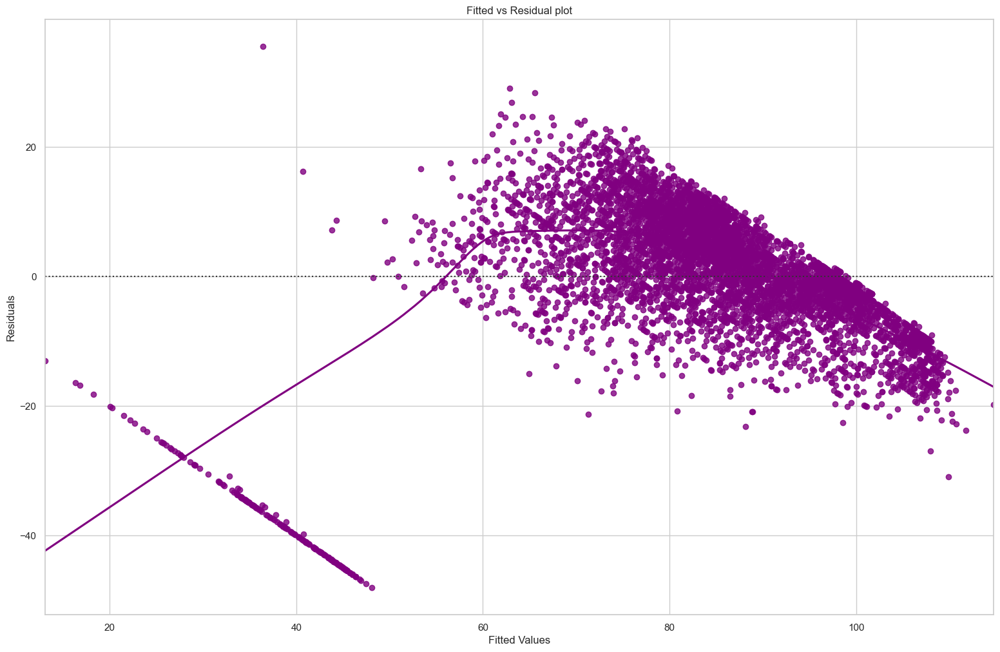

In [191]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

In [192]:
X_train9.columns

Index(['const', 'lread', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout', 'atch', 'pgin', 'pflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'], dtype='object')

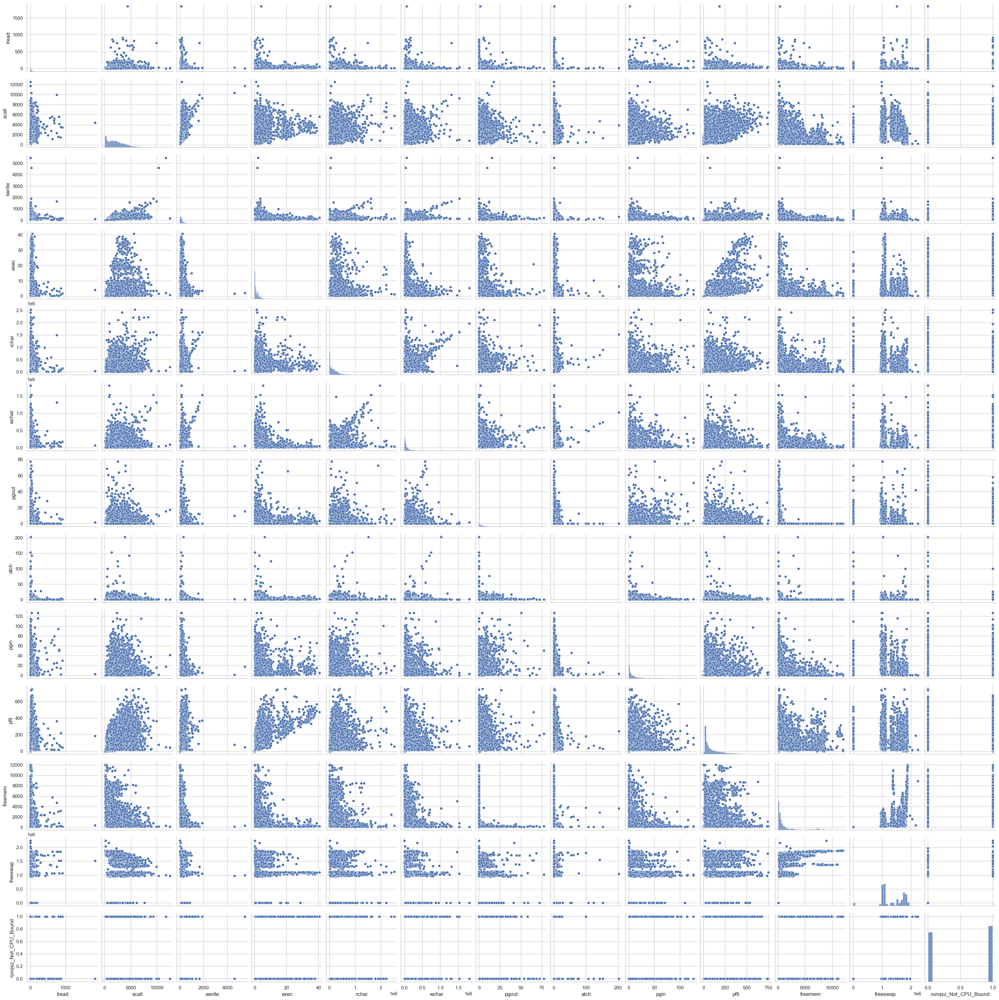

In [193]:
sns.pairplot(X_train[['lread', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout', 'atch', 'pgin', 'pflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound']])
plt.show()

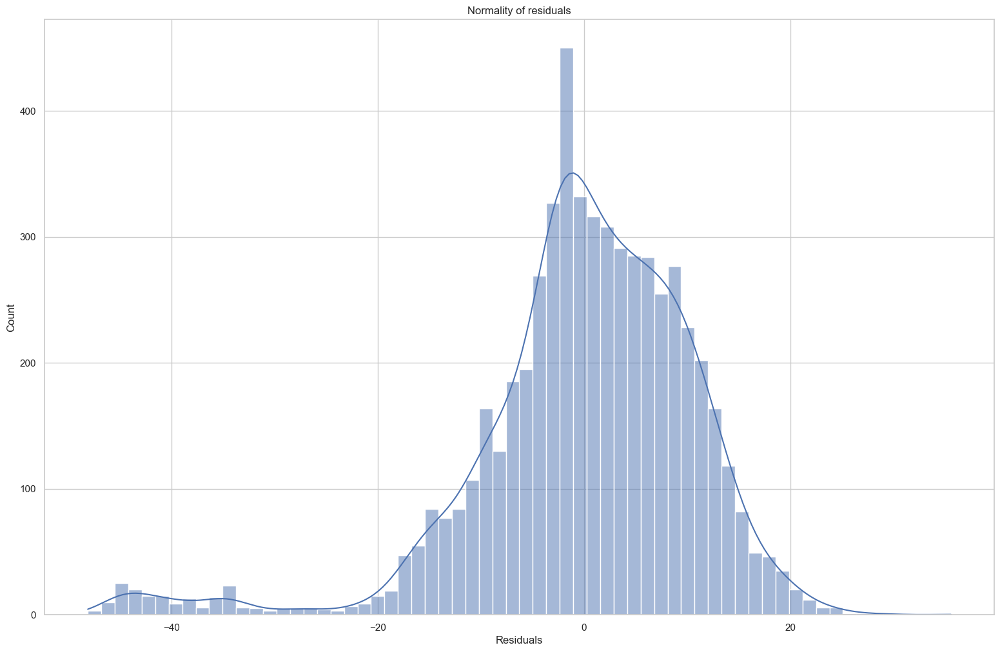

In [194]:
sns.histplot(df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()

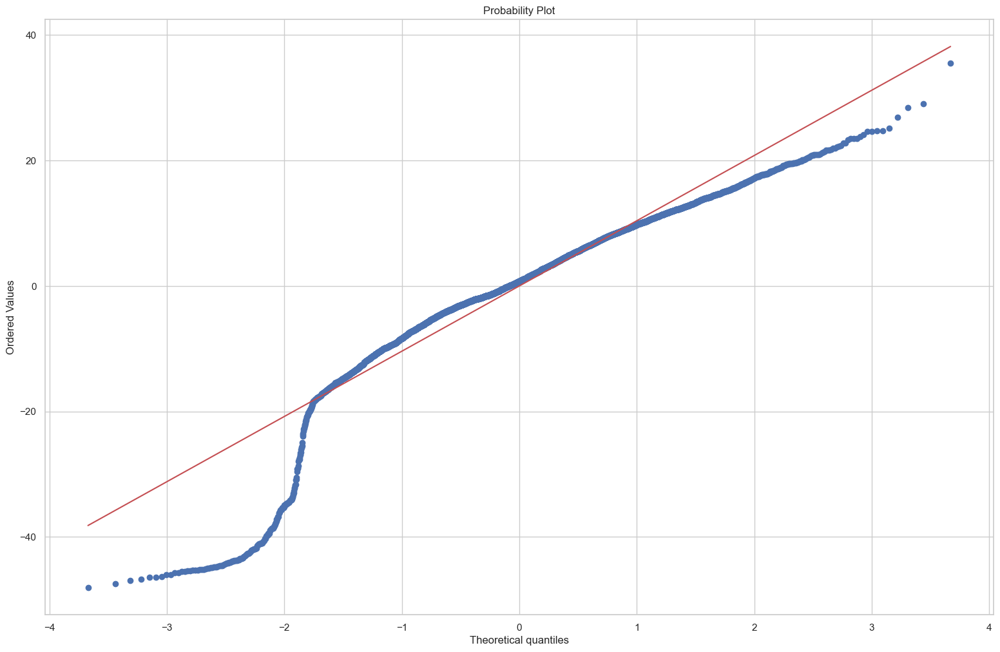

In [195]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

In [196]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9100633859634399, pvalue=0.0)

In [197]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [198]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], X_train9)
lzip(name, test)

[('F statistic', 1.1200840145965492), ('p-value', 0.0012326553084143486)]

In [199]:
olsres_8.params

const                   46.244620
lread                   -0.018147
scall                    0.001210
swrite                  -0.003717
exec                    -0.214695
rchar                   -0.000004
wchar                   -0.000012
pgout                   -0.147432
atch                    -0.051885
pgin                     0.025782
pflt                    -0.039959
freemem                 -0.001603
freeswap                 0.000031
runqsz_Not_CPU_Bound     7.709382
dtype: float64

In [200]:
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train9.columns)):
    if i == 0:
        print(olsres_8.params[i], "+", end=" ")
    elif i != len(X_train9.columns) - 1:
        print(
            olsres_8.params[i],
            "* (",
            X_train9.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_8.params[i], "* (", X_train9.columns[i], ")")

usr = 46.24461982001648 + -0.01814701122031362 * ( lread ) +  0.0012100749060047823 * ( scall ) +  -0.0037166984239540776 * ( swrite ) +  -0.21469537953195517 * ( exec ) +  -4.199441528139076e-06 * ( rchar ) +  -1.192104720989713e-05 * ( wchar ) +  -0.14743212620982396 * ( pgout ) +  -0.05188517076557647 * ( atch ) +  0.025782090458607406 * ( pgin ) +  -0.03995910766066664 * ( pflt ) +  -0.0016034674402948211 * ( freemem ) +  3.1371163153816664e-05 * ( freeswap ) +  7.709381905235096 * ( runqsz_Not_CPU_Bound )


In [201]:
y_pred = olsres_8.predict(X_test2)

In [202]:
rmse1 = np.sqrt(mean_squared_error(y_train, df_pred["Fitted Values"]))
rmse1

10.896921414000182

In [203]:
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred))
rmse2

11.703157630471747

In [204]:
mae1 = mean_absolute_error(y_train, df_pred["Fitted Values"])
mae1

7.8187363734282895

In [205]:
mae2 = mean_absolute_error(y_test, y_pred)
mae2

8.24664738386727

In [206]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [207]:
regression_model = LinearRegression()
regression_model.fit(X_train9, y_train)

LinearRegression()

In [208]:
print('The coefficient of determination R^2 of the prediction on Train set',regression_model.score(X_train9, y_train))

The coefficient of determination R^2 of the prediction on Train set 0.6372885111758064


In [209]:
print('The coefficient of determination R^2 of the prediction on Test set',regression_model.score(X_test2, y_test))

The coefficient of determination R^2 of the prediction on Test set 0.62424112812037


In [210]:
print("The Root Mean Square Error (RMSE) of the model is for test set is",np.sqrt(mean_squared_error(y_test,regression_model.predict(X_test2))))

The Root Mean Square Error (RMSE) of the model is for test set is 11.70315763047158


In [233]:
print("The Root Mean Square Error (RMSE) of the model is for training set is",np.sqrt(mean_squared_error(y_train,regression_model.predict(X_train))))

The Root Mean Square Error (RMSE) of the model is for training set is 10.81337858216829


In [228]:
vif = [variance_inflation_factor(X.values, ix) for ix in range(X.shape[1])] 

In [213]:
i=0
for column in X.columns:
    if i < 15:
        print (column ,"--->",  vif[i])
        i = i+1

const ---> 26.04471238131648
lread ---> 1.4916467571065362
lwrite ---> 1.433531931047846
scall ---> 2.481045534699188
sread ---> 6.872303179052287
swrite ---> 5.40393362774086
fork ---> 17.96510843435295
exec ---> 3.068449468818651
rchar ---> 1.9716125480686446
wchar ---> 1.5943605278030415
pgout ---> 5.486230380614653
ppgout ---> 14.831604038508068
pgfree ---> 17.633715005291815
pgscan ---> 7.599683061604395
atch ---> 1.08997848672139


In [214]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [215]:
regression_model.intercept_

array([44.64233294])

In [216]:
regression_model.coef_

array([[ 0.00000000e+00, -1.99037865e-02,  4.84993593e-03,
         1.00838542e-03, -4.23349281e-04, -2.09640404e-03,
        -1.72068587e+00, -8.99022914e-02, -4.12806135e-06,
        -1.15562535e-05, -1.74342912e-01,  9.89530505e-02,
        -7.02330085e-02,  8.59921331e-03, -7.83917112e-02,
         9.17769123e-02, -5.95528008e-02, -4.15148598e-02,
         2.22853536e-02, -1.61630964e-03,  3.21932669e-05,
         7.78819563e+00]])

In [217]:
print('The coefficient of determination R^2 of the prediction on Train set',regression_model.score(X_train, y_train))

The coefficient of determination R^2 of the prediction on Train set 0.6428287526137402


In [218]:
n= len(X_train)
p = len(X.columns)
adj_R2_train = 1- ((1-regression_model.score(X_train, y_train)) * (n-1)/(n-p-1)) #Adj R2 = 1-(1-R2)*(n-1)/(n-p-1)
print(adj_R2_train)

0.6414528521685471


In [219]:
print('The coefficient of determination R^2 of the prediction on test set',regression_model.score(X_test, y_test))

The coefficient of determination R^2 of the prediction on test set 0.6310466949936554


In [220]:
n_t= len(X_test)
p_t = len(X.columns)
adj_R2_test = 1- ((1-regression_model.score(X_test, y_test)) * (n_t-1)/(n_t-p_t-1))
print(adj_R2_test)

0.6277132359751176


In [221]:
print("The Root Mean Square Error (RMSE) of the model is for testing set is",np.sqrt(mean_squared_error(y_train,regression_model.predict(X_train))))

The Root Mean Square Error (RMSE) of the model is for testing set is 10.81337858216829


In [222]:
print("The Root Mean Square Error (RMSE) of the model is for testing set is",np.sqrt(mean_squared_error(y_test,regression_model.predict(X_test))))

The Root Mean Square Error (RMSE) of the model is for testing set is 11.596692339058599
